In [ ]:
pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     \ 25.9 MB 3.3 MB/s
     |████████████████████████████████| 10.1 MB 11.9 MB/s 
     |████████████████████████████████| 596 kB 53.3 MB/s 
     |████████████████████████████████| 102 kB 9.9 MB/s 
     |████████████████████████████████| 675 kB 42.3 MB/s 
     |████████████████████████████████| 4.7 MB 37.0 MB/s 
     |████████████████████████████████| 62 kB 927 kB/s 
     |████████████████████████████████| 812 kB 44.5 MB/s 
     |████████████████████████████████| 38.2 MB 1.3 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.1.1-py2.py3-none-any.whl size=261287 sha256=5f8f9819b25553d29973cbf24cfdfabee639ad59a6382a1cd8d9157f4a6842a5
  Stored in directory: /tmp/pip-ephem-wheel-cache-dp21cgic/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=18c4451f1191eade434c0eee4c333e08d890dddfea9a0a89a0b7a8e7ff3b93d0
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14

In [ ]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
df = pd.read_csv("/content/winequality-red.csv")
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
%matplotlib inline
from sklearn.svm import SVC
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt  
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import collections
from sklearn.metrics import plot_confusion_matrix

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [ ]:
def draw_multivarient_plot(dataset, rows, cols, plot_type,label_name):
    
    assert plot_type in ['violin', "box", "point", "bar","quality"],"We dont have such as plot type:{}".format(plot_type)
    column_names=dataset.columns.values
    number_of_column=len(column_names)
    fig, axarr=plt.subplots(rows,cols, figsize=(22,16))
    
    counter=0
    for i in range(rows):
        for j in range(cols):
            if 'violin' in plot_type:
                sns.violinplot(x=label_name, y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'box'in plot_type :
                sns.boxplot(x=label_name, y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'point' in plot_type:
                sns.pointplot(x=label_name,y=column_names[counter],data=dataset, ax=axarr[i][j])
            elif 'bar' in plot_type:
                sns.barplot(x=label_name,y=column_names[counter],data=dataset, ax=axarr[i][j])
                
            counter+=1
            if counter==(number_of_column-1,):
                break

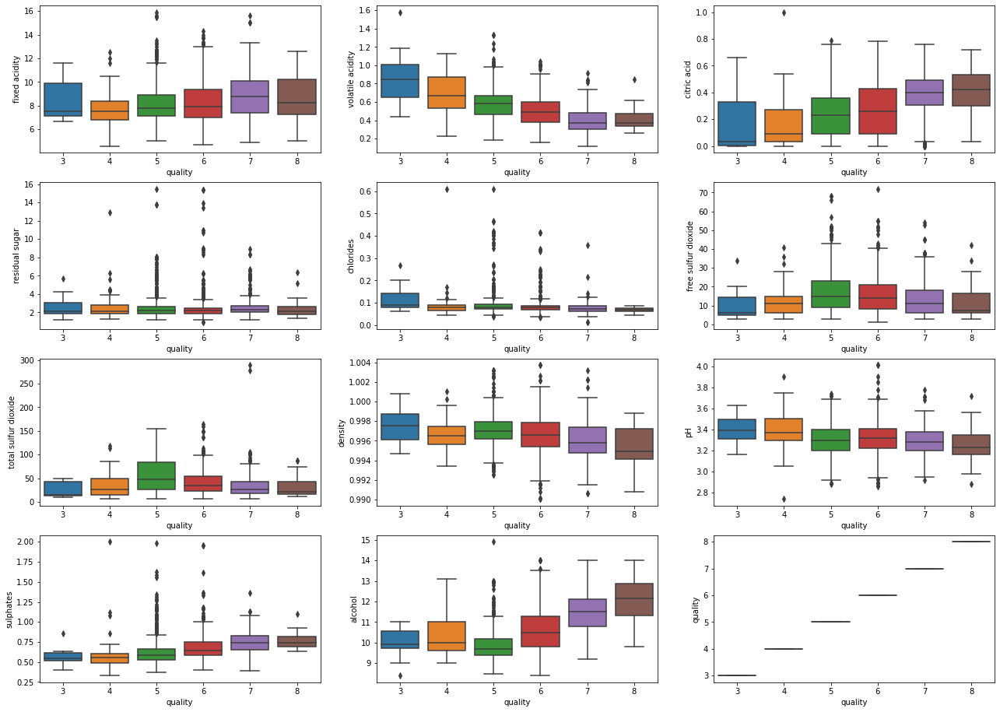

In [ ]:
draw_multivarient_plot(df,4,3,"box","quality")

In [ ]:
profile = ProfileReport(df, title="Red Wine Quality Report")

In [ ]:
profile.to_file("your_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from collections import Counter
def detect_outliers(df,features):
    outlier_indices = []
    
    for c in features:
        # 1st quartile
        Q1 = np.percentile(df[c],25)
        # 3st quartile
        Q3 = np.percentile(df[c],75)
        # IQR
        IQR = Q3 - Q1
        # Outlier Step
        outlier_step = IQR * 1.5
        # detect outlier and their indeces
        outlier_list_col = df[(df[c] < Q1 - outlier_step) | (df[c] > Q3 + outlier_step)].index
        # store indeces 
        outlier_indices.extend(outlier_list_col)
        
    outlier_indices = Counter(outlier_indices)
    multiple_outliers = list(i for i, v in outlier_indices.items() if v > 1.5) 
    
    return multiple_outliers

In [ ]:
def StratifiedSplit(dat,label_name,split_ratio):
  total_row=dat.count()[0]
  labels=dat[label_name].unique()
  ratio_dict={}
  for i in labels:
    ratio_dict[i]=dat.where(dat[label_name]==i).dropna().count()[0]/total_row
  num_sample=int(total_row*split_ratio)
  test_df=pd.DataFrame(columns=dat.columns)
  train_df=pd.DataFrame(columns=dat.columns)
  for i in labels:
    num_sample_label =int(num_sample*ratio_dict[i])
    dat_sm=dat.where(dat[label_name]==i).dropna()
    dat_sm=dat_sm.sample(frac=1)
    msk = np.random.rand(dat_sm.count()[0]) < (num_sample_label/dat_sm.count()[0])
    test_df=test_df.append(dat_sm[msk])
    train_df=train_df.append(dat_sm[~msk])
  return (train_df, test_df)

In [ ]:
print("number of outliers detected --> ",len(df.loc[detect_outliers(df,df.columns[:-1])]))
df = df.drop(detect_outliers(df,df.columns[:-1]),axis = 0).reset_index(drop = True)
df.loc[detect_outliers(df,df.columns[:-1])]

number of outliers detected -->  120


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
140,7.4,0.600,0.26,7.3,0.070,36.0,121.0,0.99820,3.37,0.49,9.4,5
141,7.3,0.590,0.26,7.2,0.070,35.0,121.0,0.99810,3.37,0.49,9.4,5
188,7.0,0.490,0.49,5.6,0.060,26.0,121.0,0.99740,3.34,0.76,10.5,5
239,11.5,0.180,0.51,4.0,0.104,4.0,23.0,0.99960,3.28,0.97,10.1,6
241,11.5,0.180,0.51,4.0,0.104,4.0,23.0,0.99960,3.28,0.97,10.1,6
247,11.5,0.180,0.51,4.0,0.104,4.0,23.0,0.99960,3.28,0.97,10.1,6
336,11.4,0.625,0.66,6.2,0.088,6.0,24.0,0.99880,3.11,0.99,13.3,6
492,10.9,0.530,0.49,4.6,0.118,10.0,17.0,1.00020,3.07,0.56,11.7,6
493,10.9,0.530,0.49,4.6,0.118,10.0,17.0,1.00020,3.07,0.56,11.7,6
857,10.2,0.440,0.58,4.1,0.092,11.0,24.0,0.99745,3.29,0.99,12.0,7


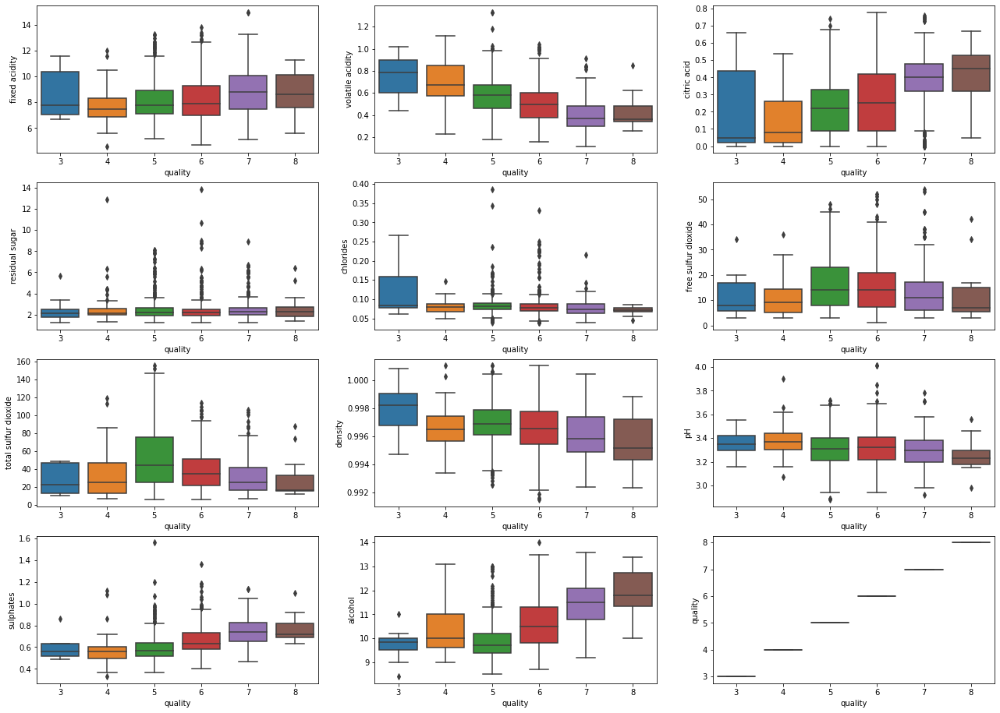

In [ ]:
draw_multivarient_plot(df,4,3,"box","quality")

In [ ]:
train, test = StratifiedSplit(df,"quality",split_ratio=0.2)

In [ ]:
train.to_csv("dataset_training.csv",index=False)
test.to_csv("dataset_scoring.csv",index=False)
df_train = pd.read_csv("/content/dataset_training.csv")
df_test = pd.read_csv("/content/dataset_scoring.csv")

dict_ = {3:"bad",4:"bad",5:"bad",6:"good",7:"good",8:"good",}
df_train_rp = df_train.replace({"quality": dict_})
df_test_rp = df_test.replace({"quality": dict_})

In [ ]:
X_train = df_train.drop('quality', axis = 1)
Y_train = df_train['quality']
X_test = df_test.drop('quality', axis = 1)
Y_test = df_test['quality']

In [ ]:
X_train_rp = df_train_rp.drop('quality', axis = 1)
Y_train_rp = df_train_rp['quality']
X_test_rp = df_test_rp.drop('quality', axis = 1)
Y_test_rp = df_test_rp['quality']

In [ ]:
rf = RandomForestClassifier(n_estimators=200,max_depth=20, random_state=44, bootstrap = False)
rf.fit(X_train, Y_train)
y_pred_rf = rf.predict(X_test)
print(classification_report(Y_test, y_pred_rf))

              precision    recall  f1-score   support

         3.0       0.00      0.00      0.00         3
         4.0       0.50      0.09      0.15        11
         5.0       0.69      0.83      0.75       111
         6.0       0.67      0.68      0.68       109
         7.0       0.70      0.57      0.63        37
         8.0       0.00      0.00      0.00         4

    accuracy                           0.68       275
   macro avg       0.43      0.36      0.37       275
weighted avg       0.66      0.68      0.66       275



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
rf_rp = RandomForestClassifier(n_estimators=200,max_depth=20, random_state=44, bootstrap = False)
rf_rp.fit(X_train_rp, Y_train_rp)
y_pred_rf_rp = rf_rp.predict(X_test_rp)
print(classification_report(Y_test_rp, y_pred_rf_rp))

              precision    recall  f1-score   support

         bad       0.78      0.82      0.80       125
        good       0.85      0.81      0.83       150

    accuracy                           0.81       275
   macro avg       0.81      0.82      0.81       275
weighted avg       0.82      0.81      0.81       275



In [ ]:
data=pd.melt(df,id_vars="quality",var_name="features",value_name='value')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 <a list of 11 Text major ticklabel objects>)

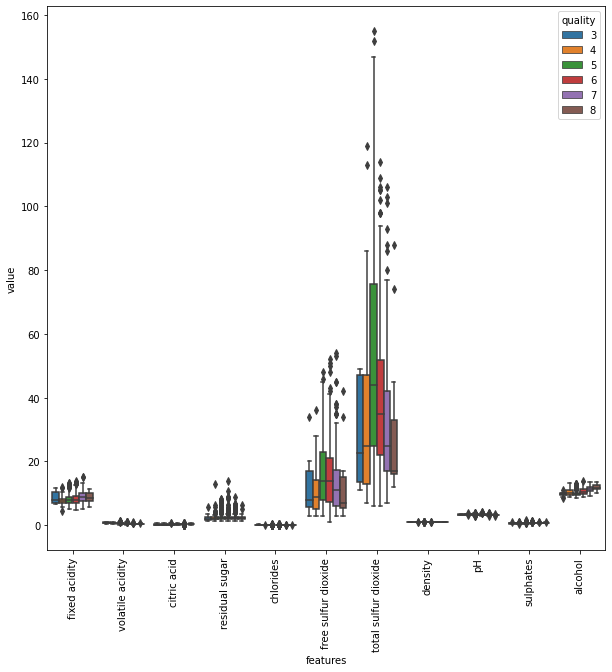

In [ ]:
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="quality", data=data)
plt.xticks(rotation=90)

Feature ranking:
1. feature 10 (0.142394)
2. feature 9 (0.115773)
3. feature 6 (0.105340)
4. feature 1 (0.095015)
5. feature 7 (0.093360)
6. feature 4 (0.081714)
7. feature 2 (0.077465)
8. feature 0 (0.075906)
9. feature 8 (0.074750)
10. feature 3 (0.073684)
11. feature 5 (0.064599)


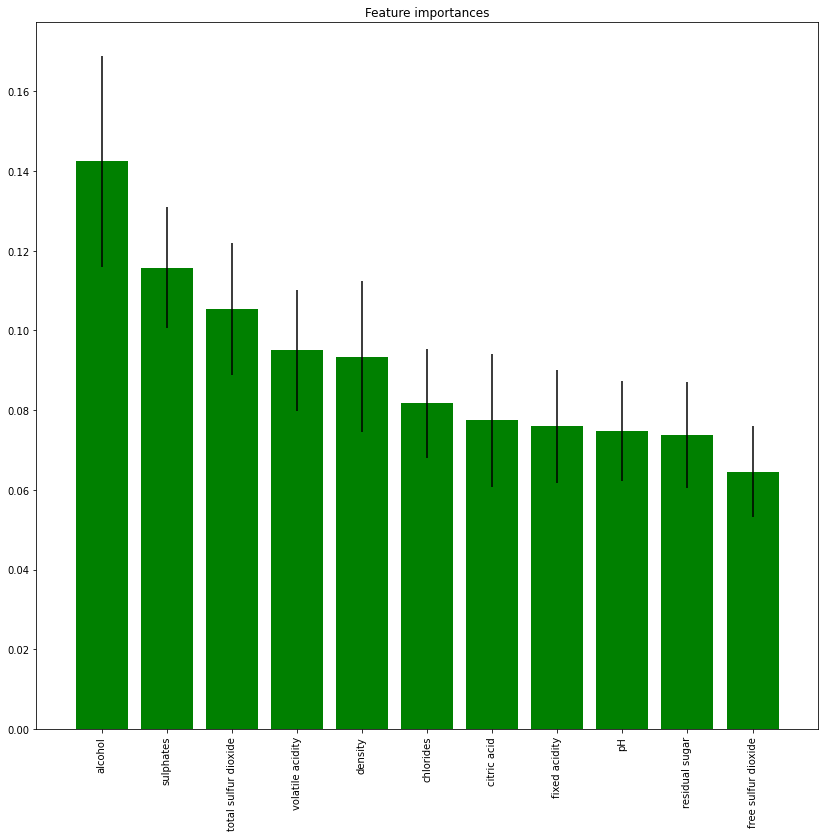

In [ ]:
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
std = np.std([tree.feature_importances_ for tree in rf.estimators_],
             axis=0)
# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the feature importances of the forest

plt.figure(1, figsize=(14, 13))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
       color="g", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), X_train.columns[indices],rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.show()


In [ ]:
rfc_eval = cross_val_score(estimator = rf, X = X_train, y = Y_train, cv = 10)
print(rfc_eval)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning: The least populated class in y has only 5 members, which is less than n_splits=10.
  UserWarning,


[0.61983471 0.73553719 0.69421488 0.66942149 0.68333333 0.69166667
 0.69166667 0.65833333 0.68333333 0.69166667]


In [ ]:
rfc_eval.mean()

0.681900826446281

In [ ]:
rfc_eval_rp = cross_val_score(estimator = rf_rp, X = X_train_rp, y = Y_train_rp, cv = 10)
print(rfc_eval_rp)

[0.74380165 0.85123967 0.7768595  0.80991736 0.75833333 0.79166667
 0.79166667 0.83333333 0.875      0.79166667]


In [ ]:
rfc_eval_rp.mean()

0.8023484848484849

In [ ]:
estimator = rf_rp.estimators_[5]

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, 
                out_file='q.dot', 
                feature_names = X_train.columns,
                class_names = "quality",
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [ ]:
# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'q.dot', '-o', 'q.png', '-Gdpi=600'])

0

In [ ]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'q.png')

In [ ]:
df_new=pd.concat([df_train, df_test], ignore_index = True, axis = 0)

In [ ]:
profile_new = ProfileReport(df_new, title="Red Wine Quality Report")

In [ ]:
profile_new.to_file("your_report_new.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]